##### Copyright 2019 The TensorFlow Authors.

Licensed under the Apache License, Version 2.0 (the "License");

# Pix2Pix

<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://www.tensorflow.org/tutorials/generative/pix2pix"><img src="https://www.tensorflow.org/images/tf_logo_32px.png" />View on TensorFlow.org</a>
  </td>
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/generative/pix2pix.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/pix2pix.ipynb"><img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a>
  </td>
  <td>
    <a href="https://storage.googleapis.com/tensorflow_docs/docs/site/en/tutorials/generative/pix2pix.ipynb"><img src="https://www.tensorflow.org/images/download_logo_32px.png" />Download notebook</a>
  </td>
</table>

## Import TensorFlow and other libraries

In [1]:
from __future__ import absolute_import, division, print_function, unicode_literals

try:
  # %tensorflow_version only exists in Colab.
  %tensorflow_version 2.x
except Exception:
  pass
import tensorflow as tf

import os
import time
import matplotlib.pyplot as plt
from IPython.display import clear_output
import numpy as np
from IPython import display

import cv2
from tqdm import tqdm

## Load the dataset

You can download this dataset and similar datasets from [here](https://people.eecs.berkeley.edu/~tinghuiz/projects/pix2pix/datasets). As mentioned in the [paper](https://arxiv.org/abs/1611.07004) we apply random jittering and mirroring to the training dataset.

* In random jittering, the image is resized to `286 x 286` and then randomly cropped to `256 x 256`
* In random mirroring, the image is randomly flipped horizontally i.e left to right.

In [2]:
if tf.test.gpu_device_name():
   print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))
else:
   print("Please install GPU version of TF")

Default GPU Device: /device:GPU:0


In [3]:
#datadir='E:\joy\thumb_phantom_3d'
datadir='/home/hzhuge/Documents/prostate margin/resize/'
PATH=os.path.join(datadir)
print(tf.__version__)


2.4.1


In [4]:
BUFFER_SIZE = 1
BATCH_SIZE = 1
IMG_WIDTH = 2048
IMG_HEIGHT = 2048


In [5]:
def load(image_file):
  image = tf.io.read_file(image_file)
  image = tf.image.decode_png(image)

  w = tf.shape(image)[1]

  w = w // 2
  real_image = image[:, :w]
  input_image = image[:, w:]

  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)
  
  input_image=tf.reshape(input_image,[IMG_WIDTH,IMG_HEIGHT,1])
  real_image=tf.reshape(real_image,[IMG_WIDTH,IMG_HEIGHT,1])
  
  return input_image, real_image

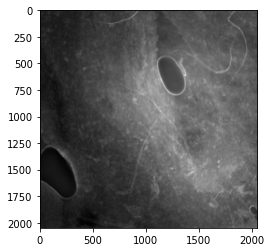

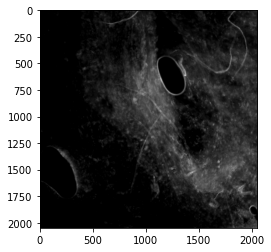

In [6]:
inp, re = load("/home/hzhuge/Documents/prostate margin/panel4_train_2048/Panel4_23_10.png")

# casting to int for matplotlib to show the image
plt.figure()
plt.imshow(inp[:,:,0]/255.0,cmap='gray')
plt.figure()
plt.imshow(re[:,:,0]/255.0,cmap='gray')

In [7]:
# normalizing the images to [-1, 1]

def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

In [8]:
def load_image_train(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [9]:
def load_image_test(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

## Input Pipeline

In [10]:
datadir='/home/hzhuge/Documents/prostate margin/panel4_train_2048'
#datadir='/home/hzhuge/Downloads/1072case/'
PATH=os.path.join(datadir)

train_dataset = tf.data.Dataset.list_files(PATH+'/*.png')
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)
train_dataset

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


<BatchDataset shapes: ((None, 2048, 2048, 1), (None, 2048, 2048, 1)), types: (tf.float32, tf.float32)>

In [11]:
datadir_test='/home/hzhuge/Documents/prostate margin/panel4_train_2048'
#datadir='/home/hzhuge/Downloads/1072case/'
PATH_test=os.path.join(datadir_test)
test_dataset = tf.data.Dataset.list_files(PATH_test+'/*.png')
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)
test_dataset

<BatchDataset shapes: ((None, 2048, 2048, 1), (None, 2048, 2048, 1)), types: (tf.float32, tf.float32)>

## Build the Generator
  * The architecture of generator is a modified U-Net.
  * Each block in the encoder is (Conv -> Batchnorm -> Leaky ReLU)
  * Each block in the decoder is (Transposed Conv -> Batchnorm -> Dropout(applied to the first 3 blocks) -> ReLU)
  * There are skip connections between the encoder and decoder (as in U-Net).



In [12]:
OUTPUT_CHANNELS =1

In [13]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [14]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(inp, 0))
print (down_result.shape)

(1, 1024, 1024, 3)


In [15]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
#     tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
#                                     padding='same',
#                                     kernel_initializer=initializer,
#                                     use_bias=False))
           tf.keras.layers.UpSampling2D(size=(2,2), interpolation='nearest') )

  result.add(
      tf.keras.layers.Conv2D(filters, size,
                             padding='same',
                             kernel_initializer=initializer,
                             use_bias=False))
    
  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [16]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 2048, 2048, 3)


In [17]:
def Generator():
  down_stack = [
    downsample(32, 4, apply_batchnorm=False), 
    downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
    downsample(128, 4), # (bs, 64, 64, 128)
    downsample(256, 4), # (bs, 32, 32, 256)
    downsample(512, 4), # (bs, 16, 16, 512)
    downsample(512, 4), # (bs, 8, 8, 512)
    downsample(512, 4), # (bs, 4, 4, 512)
    downsample(512, 4), # (bs, 2, 2, 512)
    downsample(512, 4), # (bs, 1, 1, 512)
    downsample(512, 4),
    downsample(512, 4),
    #downsample(512, 4)
  ]

  up_stack = [
    #upsample(512, 4, apply_dropout=True),
    upsample(512, 4, apply_dropout=True), 
    upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
    upsample(512, 4),  
    upsample(512, 4), # (bs, 16, 16, 1024)
    upsample(256, 4), # (bs, 32, 32, 512)
    upsample(128, 4), # (bs, 64, 64, 256)
    upsample(64, 4), # (bs, 128, 128, 128)
    upsample(32, 4)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  
  init=tf.keras.layers.UpSampling2D(size=(2,2),interpolation='nearest')
  last=tf.keras.layers.Conv2D(OUTPUT_CHANNELS,4,padding='same',kernel_initializer=initializer,activation='tanh')  
    
#   last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
#                                          strides=2,
#                                          padding='same',
#                                          kernel_initializer=initializer,
#                                          activation='tanh') # (bs, 256, 256, 4)

#   concat = tf.keras.layers.Concatenate()

  inputs = tf.keras.layers.Input(shape=[2048,2048,1])
  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    #x = concat([x, skip])
    x = tf.keras.layers.Concatenate()([x, skip])
  x = init(x)
  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

('Failed to import pydot. You must `pip install pydot` and install graphviz (https://graphviz.gitlab.io/download/), ', 'for `pydotprint` to work.')


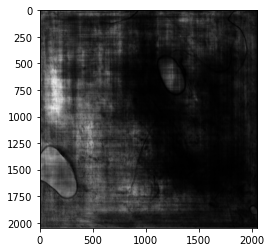

In [18]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)
gen_output = generator(inp[tf.newaxis,...], training=False)

#plt.imshow(gen_output[0,...])
plt.imshow(gen_output[0,:,:,0],cmap='gray')

## Build the Discriminator
  * The Discriminator is a PatchGAN.
  * Each block in the discriminator is (Conv -> BatchNorm -> Leaky ReLU)
  * The shape of the output after the last layer is (batch_size, 30, 30, 1)
  * Each 30x30 patch of the output classifies a 70x70 portion of the input image (such an architecture is called a PatchGAN).
  * Discriminator receives 2 inputs.
    * Input image and the target image, which it should classify as real.
    * Input image and the generated image (output of generator), which it should classify as fake.
    * We concatenate these 2 inputs together in the code (`tf.concat([inp, tar], axis=-1)`)

In [19]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[2048, 2048, 1], name='input_image')
  tar = tf.keras.layers.Input(shape=[2048, 2048, 1], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar]) # (bs, 256, 256, channels*2)
  
  down1 = downsample(32, 4, False)(x) # (bs, 128, 128, 64)
  down2 = downsample(64, 4)(down1) # (bs, 64, 64, 128)
  down3 = downsample(128, 4)(down2) # (bs, 32, 32, 256)
  down4 = downsample(256, 4)(down3)
  down5 = downsample(512, 4)(down4)
  down6 = downsample(1024, 4)(down5)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down6) # (bs, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(1024, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

('Failed to import pydot. You must `pip install pydot` and install graphviz (https://graphviz.gitlab.io/download/), ', 'for `pydotprint` to work.')


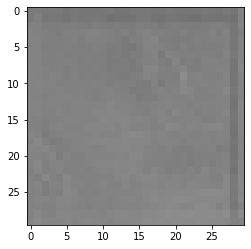

In [20]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

disc_out = discriminator([inp[tf.newaxis,...], gen_output], training=False)
plt.imshow(disc_out[0,...,-1], vmin=-20, vmax=20, cmap='gray')

To learn more about the architecture and the hyperparameters you can refer the [paper](https://arxiv.org/abs/1611.07004).

## Define the loss functions and the optimizer

* **Discriminator loss**
  * The discriminator loss function takes 2 inputs; **real images, generated images**
  * real_loss is a sigmoid cross entropy loss of the **real images** and an **array of ones(since these are the real images)**
  * generated_loss is a sigmoid cross entropy loss of the **generated images** and an **array of zeros(since these are the fake images)**
  * Then the total_loss is the sum of real_loss and the generated_loss

* **Generator loss**
  * It is a sigmoid cross entropy loss of the generated images and an **array of ones**.
  * The [paper](https://arxiv.org/abs/1611.07004) also includes L1 loss which is MAE (mean absolute error) between the generated image and the target image.
  * This allows the generated image to become structurally similar to the target image.
  * The formula to calculate the total generator loss = gan_loss + LAMBDA * l1_loss, where LAMBDA = 100. This value was decided by the authors of the [paper](https://arxiv.org/abs/1611.07004).

In [21]:
LAMBDA = 100

In [22]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [23]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

In [24]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

In [25]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

## Checkpoints (Object-based saving)

In [26]:
checkpoint_path = '/home/hzhuge/Documents/prostate margin/checkpoints_panel4_2048'
#checkpoint_path = '/home/hzhuge/Downloads/1072case/training_checkpoints'
ckpt = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path,max_to_keep=2000)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
  ckpt.restore(ckpt_manager.latest_checkpoint)
  print ('Latest checkpoint restored!!')

Latest checkpoint restored!!


## Training

* We start by iterating over the dataset
* The generator gets the input image and we get a generated output.
* The discriminator receives the input_image and the generated image as the first input. The second input is the input_image and the target_image.
* Next, we calculate the generator and the discriminator loss.
* Then, we calculate the gradients of loss with respect to both the generator and the discriminator variables(inputs) and apply those to the optimizer.
* This entire procedure is shown in the images below.

![Discriminator Update Image](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/dis.png?raw=1)


---


![Generator Update Image](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/gen.png?raw=1)

## Generate Images

* After training, its time to generate some images!
* We pass images from the test dataset to the generator.
* The generator will then translate the input image into the output we expect.
* Last step is to plot the predictions and **voila!**

In [27]:
EPOCHS = 1000


In [34]:
import pandas as pd

In [35]:
def ssim_mse(model, test_input, tar):
  # the training=True is intentional here since
  # we want the batch statistics while running the model
  # on the test dataset. If we use training=False, we will get
  # the accumulated statistics learned from the training dataset
  # (which we don't want)
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15,15))
  

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']
  inputim_l=np.array(display_list[0]*0.5+0.5)
  ground_l=np.array(display_list[1]*0.5+0.5)
  predict_l=np.array(display_list[2]*0.5+0.5)
  
  inputim_g= display_list[0]*0.5+0.5
  ground_g = display_list[1]*0.5+0.5
  predict_g = display_list[2]*0.5+0.5
  
  mgi=np.square(np.subtract(ground_l, inputim_l)).mean()
  sgi=tf.image.ssim(ground_g,inputim_g, max_val=1.0).numpy()
     
  mgp=np.square(np.subtract(ground_l, predict_l)).mean()
  sgp=tf.image.ssim(ground_g,predict_g, max_val=1.0).numpy()
       
  mip=np.square(np.subtract(inputim_l, predict_l)).mean()
  sip=tf.image.ssim(inputim_g,predict_g, max_val=1.0).numpy()
  
#  df = pd.DataFrame(np.array([mgi,mgp,mip,sgi,sgp,sip]), columns =['mse_ground_input','mse_ground_predict','mse_input_predict','ssim_ground_input',
#           'ssim_ground_predict','ssim_input_predict']) 
  d={'mse_ground_input':mgi,'mse_ground_predict':mgp,'mse_input_predict':mip,'ssim_ground_input':sgi,
           'ssim_ground_predict':sgp,'ssim_input_predict':sip}
  ps=pd.Series(d)

 
    
  for i in range(0,3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    im=display_list[i]
    img=im[:,:,0] * 0.5 + 0.5
    plt.imshow(img,cmap='gray')
    plt.axis('off')   
  plt.show()
  print(ps)
  

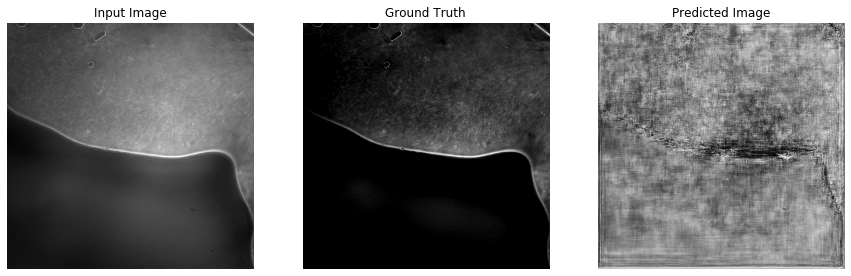

mse_ground_input       0.109839
mse_ground_predict     0.175018
mse_input_predict      0.035935
ssim_ground_input      0.268612
ssim_ground_predict    0.148885
ssim_input_predict     0.590252
dtype: float64


In [29]:
for example_input, example_target in test_dataset.take(1):
  ssim_mse(generator, example_input, example_target)

In [30]:
import datetime
log_dir="/home/hzhuge/Documents/prostate margin/logs/"

summary_writer = tf.summary.create_file_writer(
       log_dir  + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [31]:
@tf.function
def train_step(input_image, target,epoch):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)
    
  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))
    
  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=epoch)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=epoch)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=epoch)
    tf.summary.scalar('disc_loss', disc_loss, step=epoch)
  

In [44]:
def fit(train_ds, epochs, test_ds):
  for epoch in range(613,1200):
    ckpt.restore(ckpt_manager.latest_checkpoint)
   
    if ckpt_manager.latest_checkpoint:
          print("Restored from {}".format(ckpt_manager.latest_checkpoint))
    else:
          print("Initializing from scratch.")
            
    start = time.time()
    
    display.clear_output(wait=True)
    
     # Test on the same image so that the progress of the model can be 
    # easily seen.
    for example_input, example_target in test_ds.take(3):
      ssim_mse(generator, example_input, example_target)
    print("Epoch: ", epoch)
    
    
    # Train
    for n, (input_image, target) in train_ds.enumerate():
      print('.', end='')
      if (n+1) % 100 == 0:
        print()
      train_step(input_image, target, epoch)
    print()

    
   

    # saving (checkpoint) the model every 50 epochs
    if (epoch + 1) % 100 == 0:
        ckpt_save_path = ckpt_manager.save()
        print ('Saving checkpoint for epoch {} at {}'.format(epoch+1,
                                                         ckpt_save_path))

   

    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                        time.time()-start))

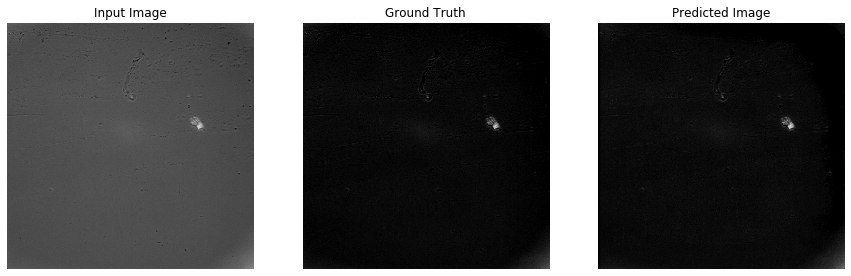

mse_ground_input       0.122793
mse_ground_predict     0.000163
mse_input_predict      0.119442
ssim_ground_input      0.156553
ssim_ground_predict    0.879354
ssim_input_predict     0.176214
dtype: float64


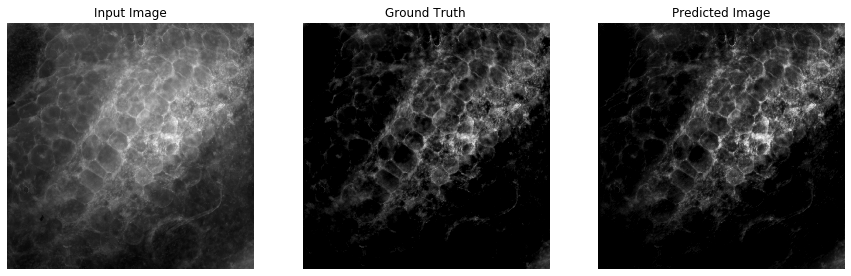

mse_ground_input       0.079438
mse_ground_predict     0.000393
mse_input_predict      0.080986
ssim_ground_input      0.296354
ssim_ground_predict    0.913743
ssim_input_predict     0.301685
dtype: float64


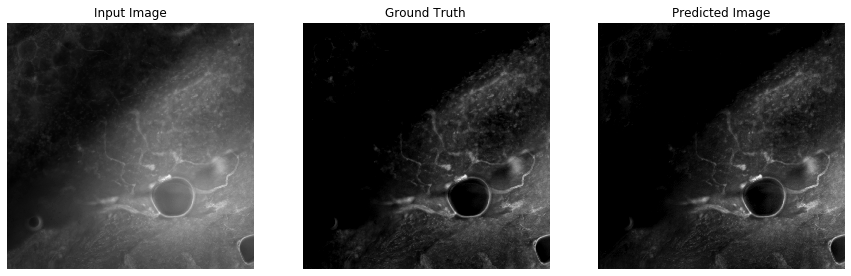

mse_ground_input       0.056484
mse_ground_predict     0.000387
mse_input_predict      0.057845
ssim_ground_input      0.319053
ssim_ground_predict    0.920579
ssim_input_predict     0.328873
dtype: float64
Epoch:  1199
....................................................................................................
....................................................................................................
....................................................................................................
..................................................
Saving checkpoint for epoch 1200 at /home/hzhuge/Documents/prostate margin/checkpoints_panel4_2048/ckpt-18
Time taken for epoch 1200 is 264.9638168811798 sec



In [45]:
fit(train_dataset, EPOCHS, test_dataset)

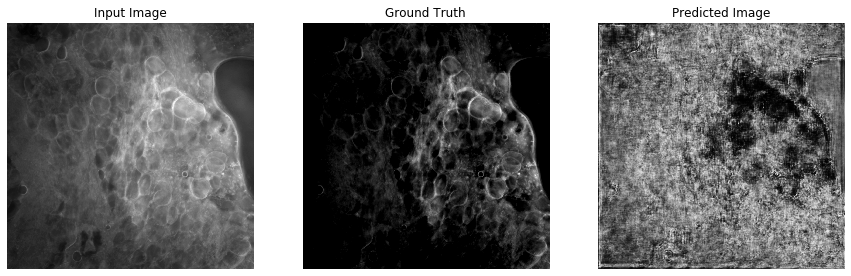

mse_ground_input       0.100786
mse_ground_predict     0.161695
mse_input_predict      0.058263
ssim_ground_input      0.281789
ssim_ground_predict    0.074507
ssim_input_predict     0.290269
dtype: float64


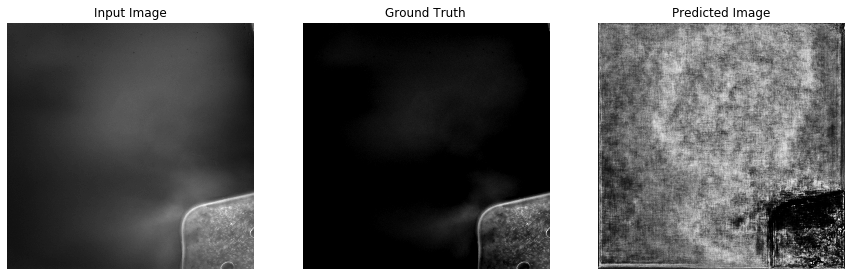

mse_ground_input       0.116101
mse_ground_predict     0.214436
mse_input_predict      0.046255
ssim_ground_input      0.150748
ssim_ground_predict    0.053400
ssim_input_predict     0.479410
dtype: float64


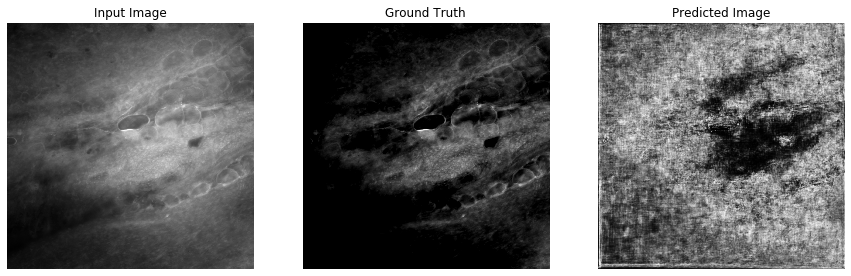

mse_ground_input       0.090982
mse_ground_predict     0.158699
mse_input_predict      0.063062
ssim_ground_input      0.323890
ssim_ground_predict    0.098850
ssim_input_predict     0.332564
dtype: float64
Epoch:  1
.

ResourceExhaustedError: 2 root error(s) found.
  (0) Resource exhausted:  OOM when allocating tensor with shape[1,128,2048,2048] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node model/conv2d_23/Conv2D-0-TransposeNHWCToNCHW-LayoutOptimizer}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.

	 [[add_1/_12]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.

  (1) Resource exhausted:  OOM when allocating tensor with shape[1,128,2048,2048] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node model/conv2d_23/Conv2D-0-TransposeNHWCToNCHW-LayoutOptimizer}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.

0 successful operations.
0 derived errors ignored. [Op:__inference_train_step_18709]

Function call stack:
train_step -> train_step


In [32]:
fit(train_dataset, EPOCHS, test_dataset)

## Restore the latest checkpoint and test

In [29]:
!ls {checkpoint_path} 
checkpoint_path

ls: cannot access '/home/hzhuge/Documents/prostate': No such file or directory
ls: cannot access 'margin/checkpoints_panel4_2048': No such file or directory


'/home/hzhuge/Documents/prostate margin/checkpoints_panel4_2048'

In [30]:
# restoring the latest checkpoint in checkpoint_dir
#checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))
ckpt.restore(ckpt_manager.latest_checkpoint)


## Generate using test dataset

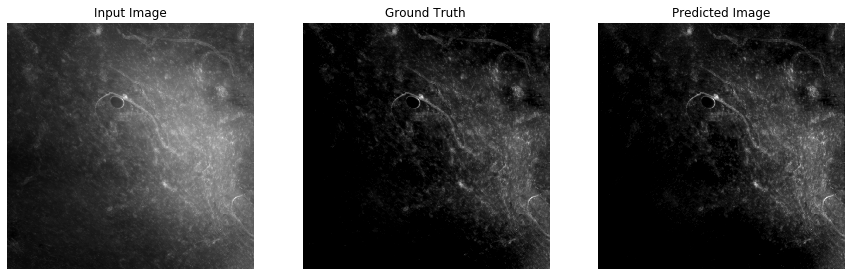

mse_ground_input       0.082441
mse_ground_predict     0.000160
mse_input_predict      0.082917
ssim_ground_input      0.290714
ssim_ground_predict    0.926810
ssim_input_predict     0.295160
dtype: float64


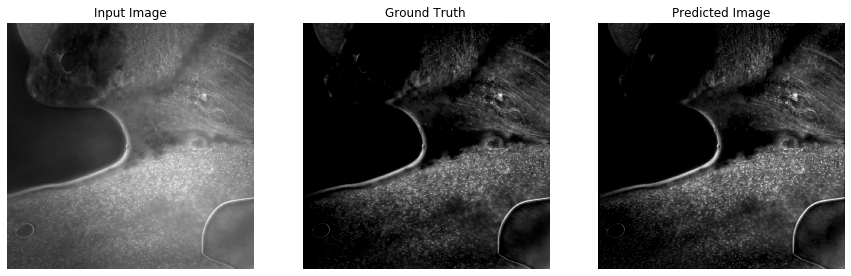

mse_ground_input       0.098597
mse_ground_predict     0.000548
mse_input_predict      0.099641
ssim_ground_input      0.329874
ssim_ground_predict    0.919216
ssim_input_predict     0.337282
dtype: float64


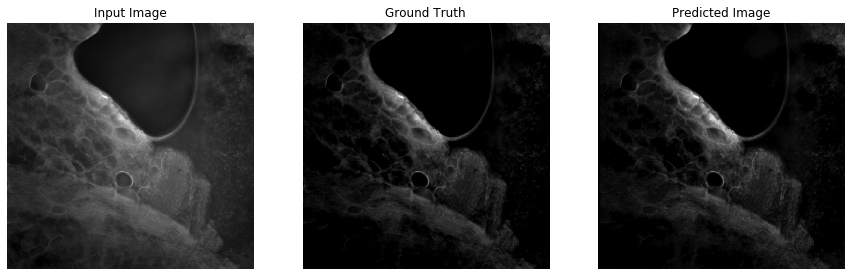

mse_ground_input       0.059195
mse_ground_predict     0.000163
mse_input_predict      0.058864
ssim_ground_input      0.240065
ssim_ground_predict    0.891925
ssim_input_predict     0.258187
dtype: float64


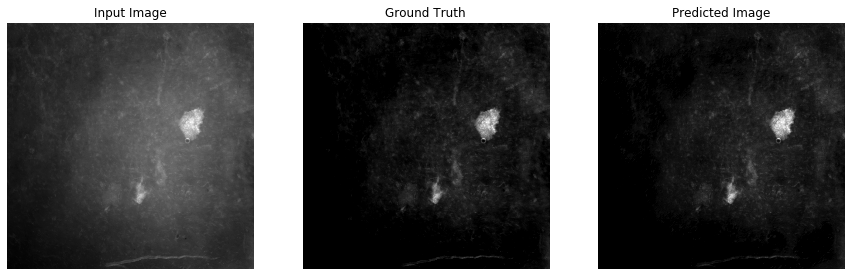

mse_ground_input       0.074809
mse_ground_predict     0.000179
mse_input_predict      0.073452
ssim_ground_input      0.240077
ssim_ground_predict    0.913527
ssim_input_predict     0.262764
dtype: float64


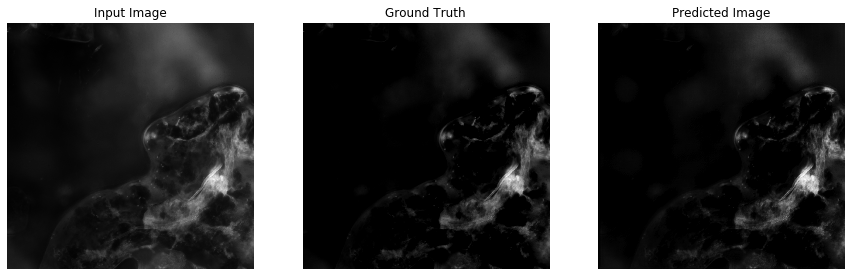

mse_ground_input       0.010857
mse_ground_predict     0.000240
mse_input_predict      0.010539
ssim_ground_input      0.253177
ssim_ground_predict    0.851275
ssim_input_predict     0.334859
dtype: float64


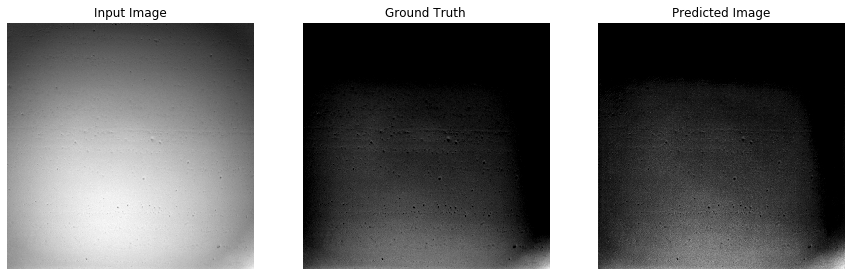

mse_ground_input       0.335268
mse_ground_predict     0.000533
mse_input_predict      0.332900
ssim_ground_input      0.239327
ssim_ground_predict    0.861563
ssim_input_predict     0.217302
dtype: float64


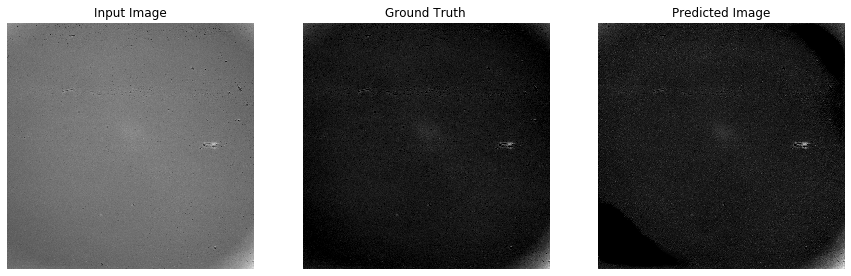

mse_ground_input       0.251291
mse_ground_predict     0.000767
mse_input_predict      0.248794
ssim_ground_input      0.241894
ssim_ground_predict    0.721787
ssim_input_predict     0.215147
dtype: float64


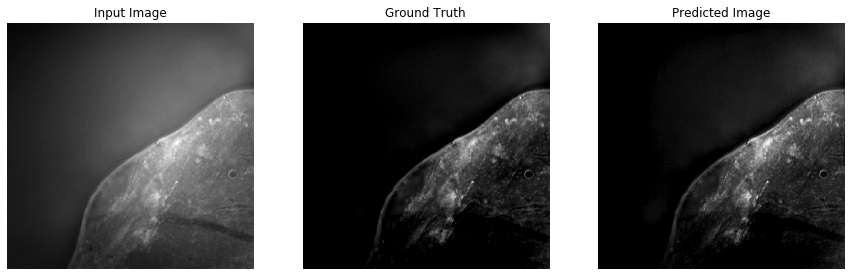

mse_ground_input       0.099996
mse_ground_predict     0.000500
mse_input_predict      0.095244
ssim_ground_input      0.213495
ssim_ground_predict    0.840852
ssim_input_predict     0.256683
dtype: float64


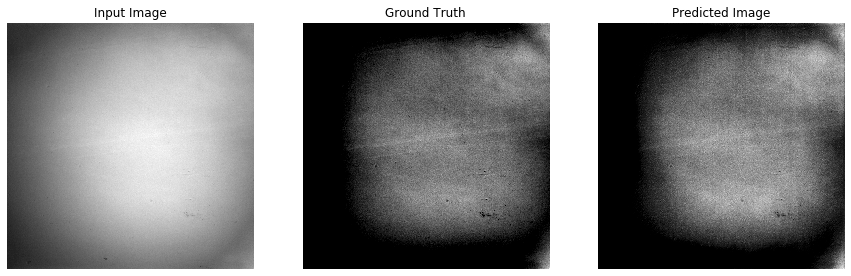

mse_ground_input       0.271835
mse_ground_predict     0.001591
mse_input_predict      0.278787
ssim_ground_input      0.263117
ssim_ground_predict    0.765333
ssim_input_predict     0.268553
dtype: float64


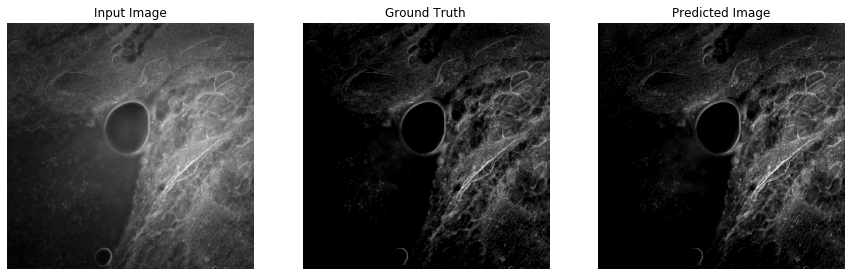

mse_ground_input       0.088215
mse_ground_predict     0.000239
mse_input_predict      0.086899
ssim_ground_input      0.298319
ssim_ground_predict    0.922983
ssim_input_predict     0.314096
dtype: float64


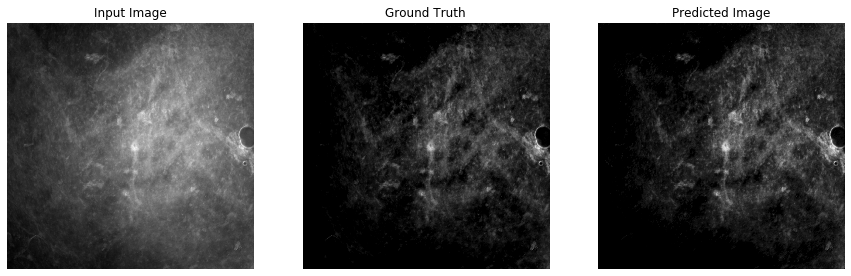

mse_ground_input       0.136101
mse_ground_predict     0.000205
mse_input_predict      0.135119
ssim_ground_input      0.287387
ssim_ground_predict    0.927480
ssim_input_predict     0.292365
dtype: float64


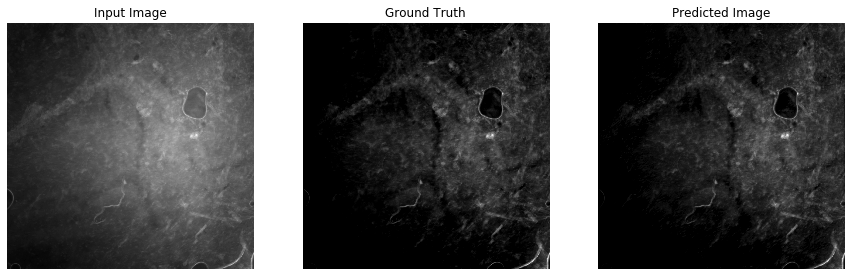

mse_ground_input       0.103780
mse_ground_predict     0.000306
mse_input_predict      0.105929
ssim_ground_input      0.296523
ssim_ground_predict    0.928050
ssim_input_predict     0.299612
dtype: float64


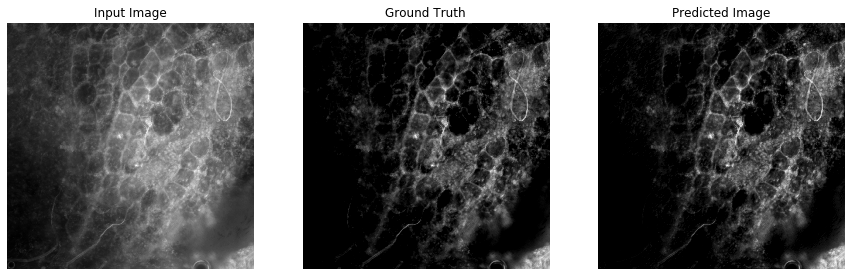

mse_ground_input       0.083572
mse_ground_predict     0.000675
mse_input_predict      0.089000
ssim_ground_input      0.319958
ssim_ground_predict    0.910294
ssim_input_predict     0.310633
dtype: float64


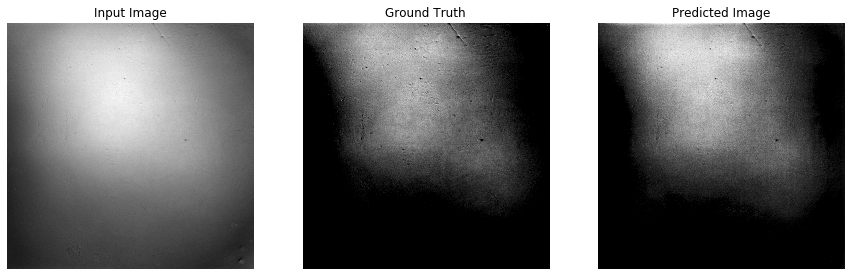

mse_ground_input       0.202137
mse_ground_predict     0.001179
mse_input_predict      0.202939
ssim_ground_input      0.264213
ssim_ground_predict    0.808820
ssim_input_predict     0.289540
dtype: float64


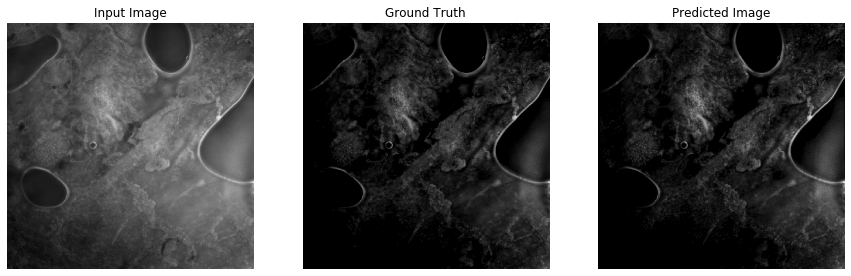

mse_ground_input       0.100915
mse_ground_predict     0.000190
mse_input_predict      0.101582
ssim_ground_input      0.294370
ssim_ground_predict    0.937931
ssim_input_predict     0.293450
dtype: float64


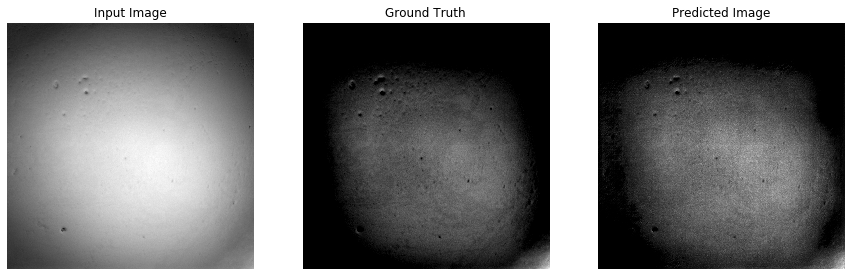

mse_ground_input       0.321223
mse_ground_predict     0.002902
mse_input_predict      0.345496
ssim_ground_input      0.253746
ssim_ground_predict    0.775874
ssim_input_predict     0.230028
dtype: float64


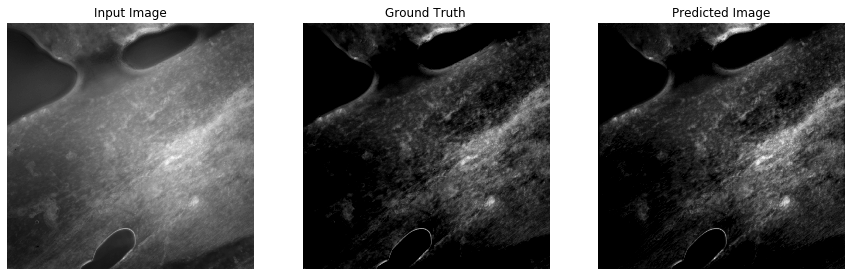

mse_ground_input       0.099281
mse_ground_predict     0.000542
mse_input_predict      0.104018
ssim_ground_input      0.342456
ssim_ground_predict    0.930907
ssim_input_predict     0.334886
dtype: float64


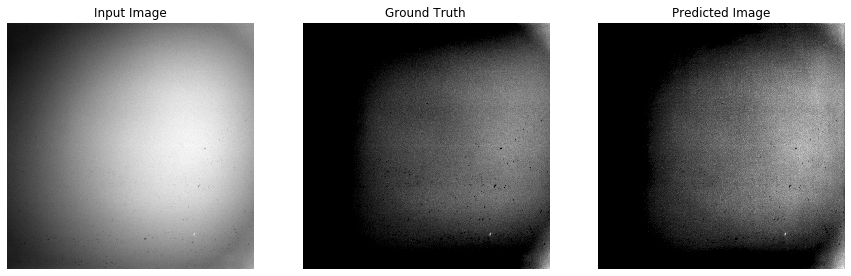

mse_ground_input       0.255133
mse_ground_predict     0.001178
mse_input_predict      0.263798
ssim_ground_input      0.291576
ssim_ground_predict    0.837519
ssim_input_predict     0.280036
dtype: float64


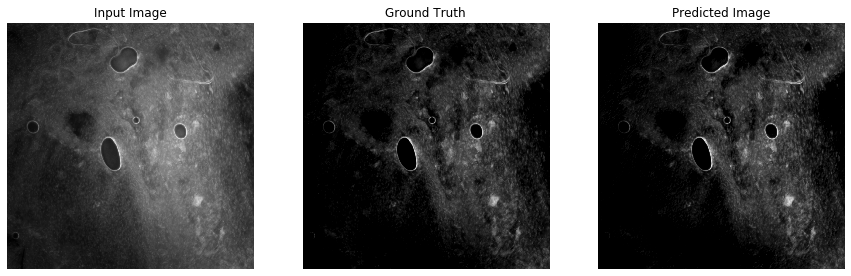

mse_ground_input       0.063693
mse_ground_predict     0.000372
mse_input_predict      0.069315
ssim_ground_input      0.357003
ssim_ground_predict    0.929837
ssim_input_predict     0.322508
dtype: float64


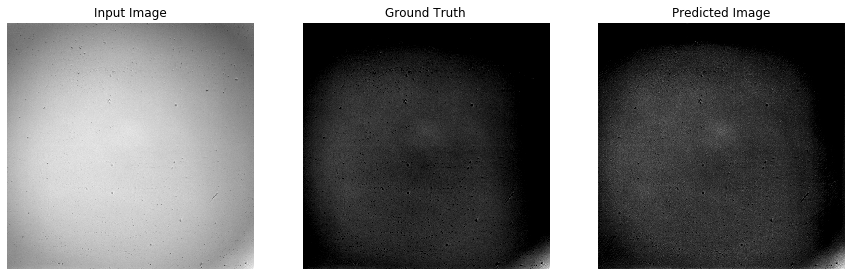

mse_ground_input       0.443011
mse_ground_predict     0.000890
mse_input_predict      0.426224
ssim_ground_input      0.206691
ssim_ground_predict    0.781946
ssim_input_predict     0.207480
dtype: float64


In [37]:
## epoch 613
for example_input, example_target in test_dataset.take(20):
  ssim_mse(generator, example_input, example_target)


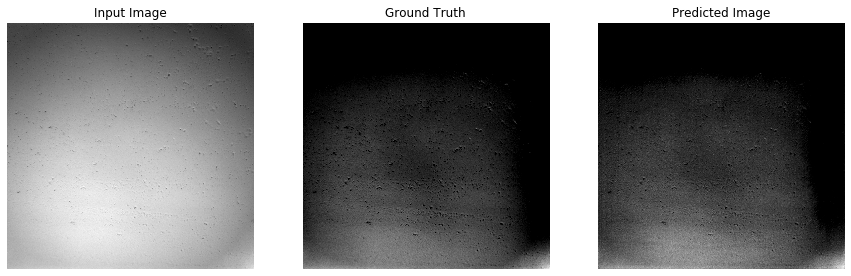

mse_ground_input       0.316585
mse_ground_predict     0.000574
mse_input_predict      0.316612
ssim_ground_input      0.262874
ssim_ground_predict    0.853551
ssim_input_predict     0.235436
dtype: float64


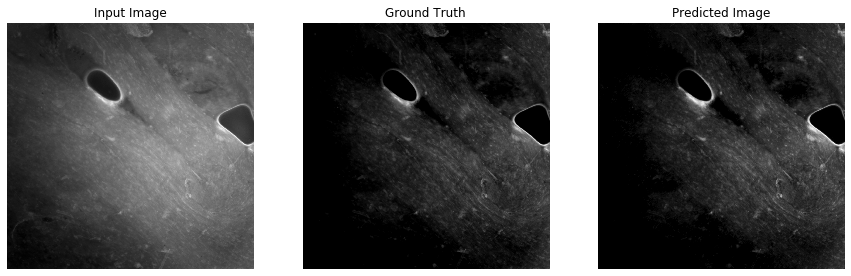

mse_ground_input       0.115889
mse_ground_predict     0.000204
mse_input_predict      0.114041
ssim_ground_input      0.307669
ssim_ground_predict    0.940358
ssim_input_predict     0.310715
dtype: float64


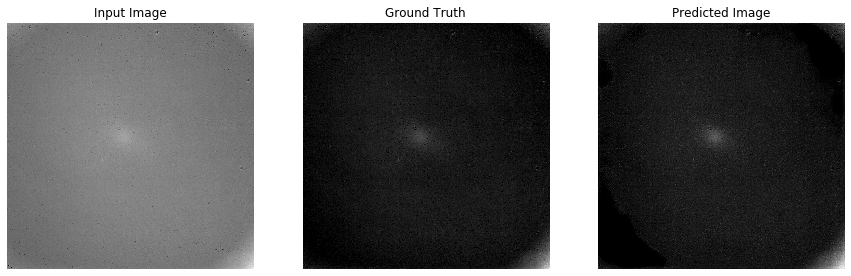

mse_ground_input       0.286369
mse_ground_predict     0.000710
mse_input_predict      0.286005
ssim_ground_input      0.219568
ssim_ground_predict    0.718459
ssim_input_predict     0.196980
dtype: float64


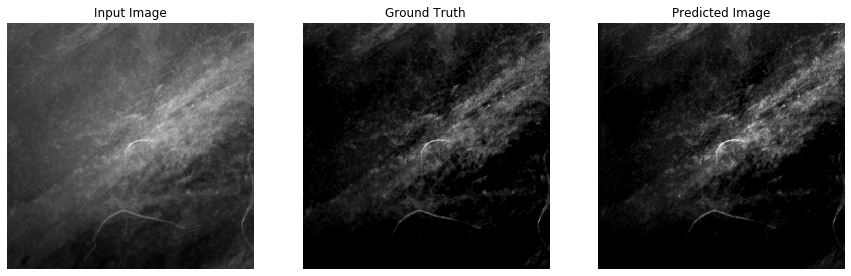

mse_ground_input       0.069124
mse_ground_predict     0.000258
mse_input_predict      0.068979
ssim_ground_input      0.328824
ssim_ground_predict    0.923091
ssim_input_predict     0.322662
dtype: float64


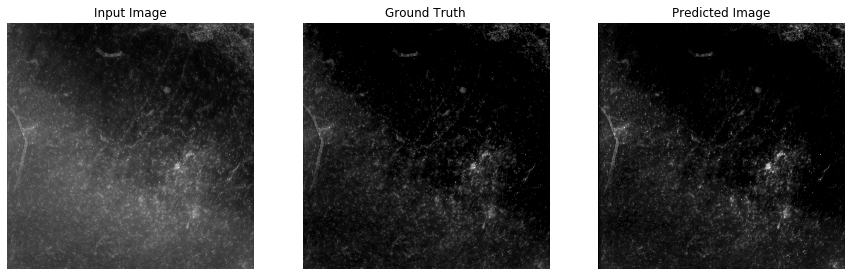

mse_ground_input       0.045729
mse_ground_predict     0.000323
mse_input_predict      0.045971
ssim_ground_input      0.321980
ssim_ground_predict    0.928996
ssim_input_predict     0.319685
dtype: float64


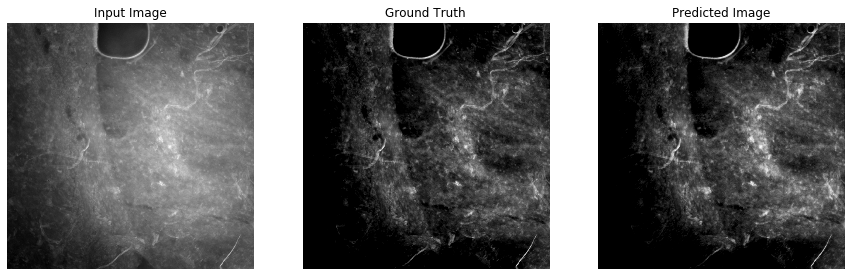

mse_ground_input       0.137410
mse_ground_predict     0.000524
mse_input_predict      0.134191
ssim_ground_input      0.362699
ssim_ground_predict    0.917985
ssim_input_predict     0.369396
dtype: float64


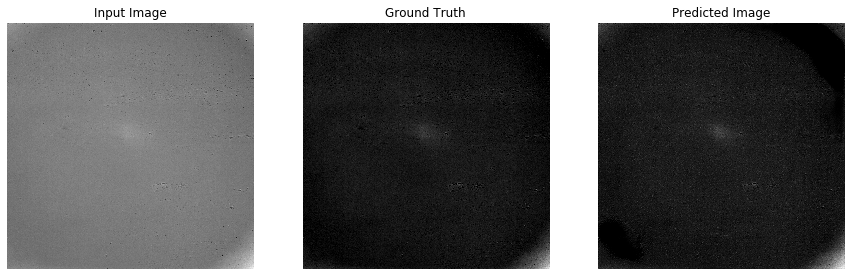

mse_ground_input       0.283800
mse_ground_predict     0.000780
mse_input_predict      0.278223
ssim_ground_input      0.226597
ssim_ground_predict    0.732309
ssim_input_predict     0.211395
dtype: float64


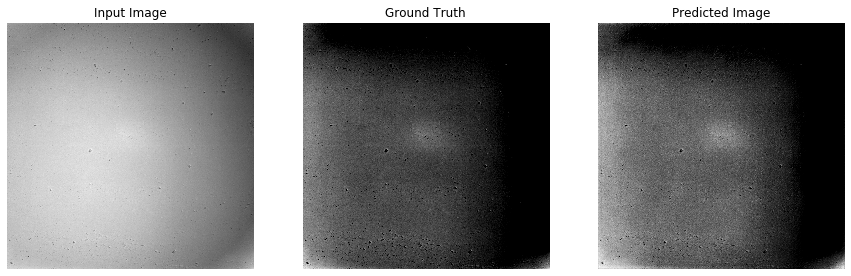

mse_ground_input       0.327440
mse_ground_predict     0.004553
mse_input_predict      0.279465
ssim_ground_input      0.260368
ssim_ground_predict    0.770426
ssim_input_predict     0.261973
dtype: float64


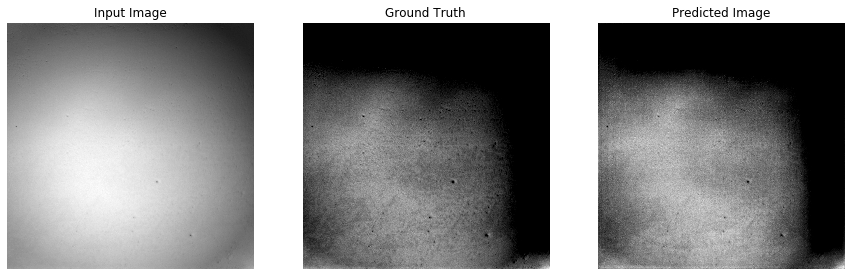

mse_ground_input       0.218337
mse_ground_predict     0.001527
mse_input_predict      0.203580
ssim_ground_input      0.314401
ssim_ground_predict    0.810447
ssim_input_predict     0.309276
dtype: float64


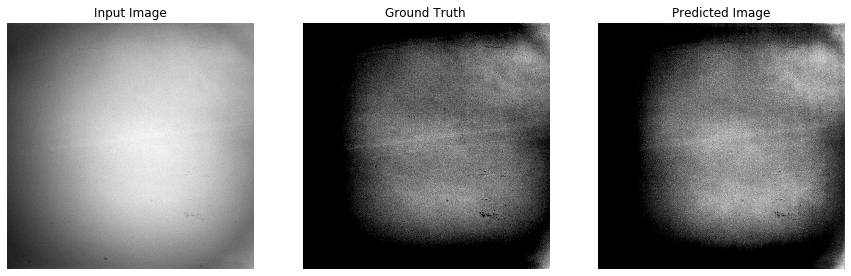

mse_ground_input       0.271835
mse_ground_predict     0.001750
mse_input_predict      0.256811
ssim_ground_input      0.263117
ssim_ground_predict    0.772763
ssim_input_predict     0.280441
dtype: float64


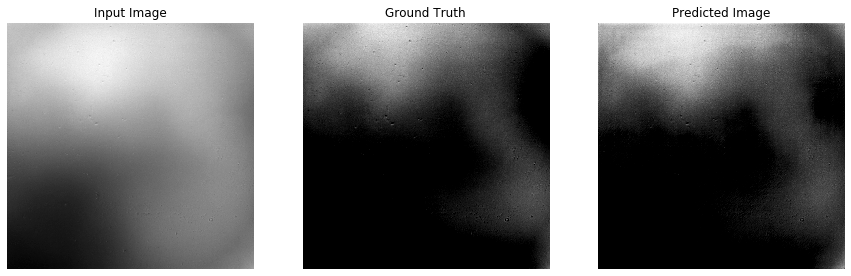

mse_ground_input       0.184143
mse_ground_predict     0.001107
mse_input_predict      0.174897
ssim_ground_input      0.293906
ssim_ground_predict    0.861742
ssim_input_predict     0.299204
dtype: float64


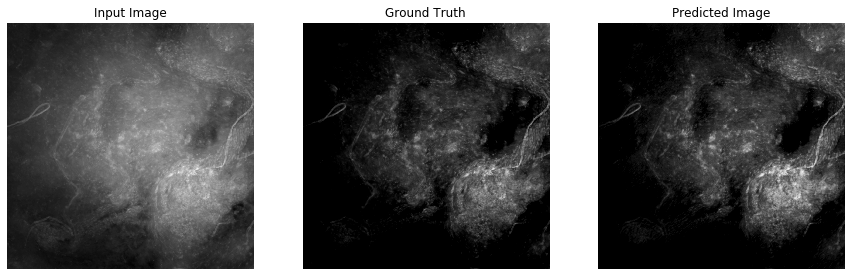

mse_ground_input       0.097347
mse_ground_predict     0.000249
mse_input_predict      0.094015
ssim_ground_input      0.314095
ssim_ground_predict    0.922990
ssim_input_predict     0.332238
dtype: float64


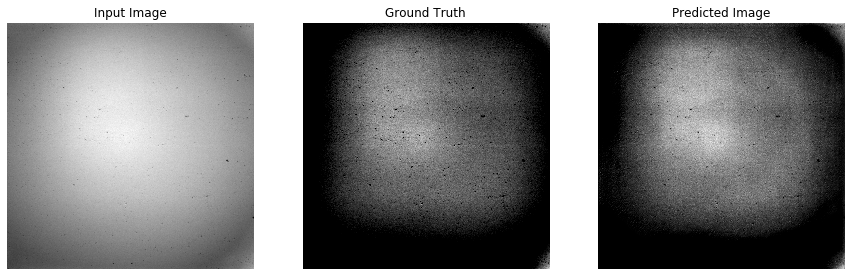

mse_ground_input       0.309145
mse_ground_predict     0.002414
mse_input_predict      0.303095
ssim_ground_input      0.218566
ssim_ground_predict    0.709758
ssim_input_predict     0.252414
dtype: float64


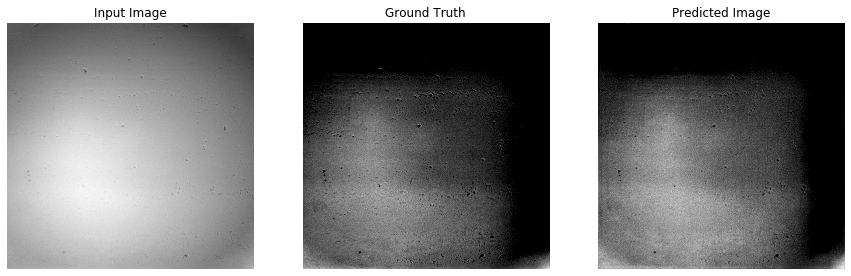

mse_ground_input       0.260388
mse_ground_predict     0.002333
mse_input_predict      0.233694
ssim_ground_input      0.278473
ssim_ground_predict    0.798800
ssim_input_predict     0.291394
dtype: float64


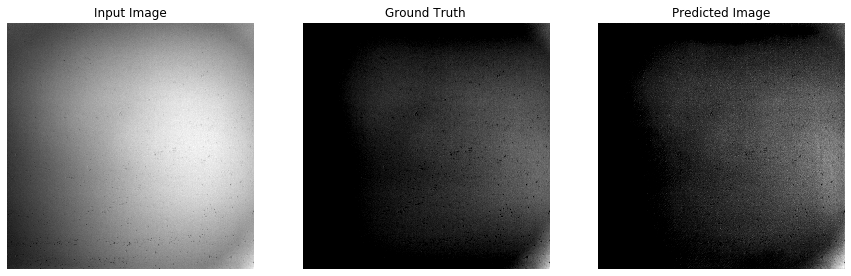

mse_ground_input       0.350625
mse_ground_predict     0.000854
mse_input_predict      0.333948
ssim_ground_input      0.238666
ssim_ground_predict    0.811836
ssim_input_predict     0.214081
dtype: float64


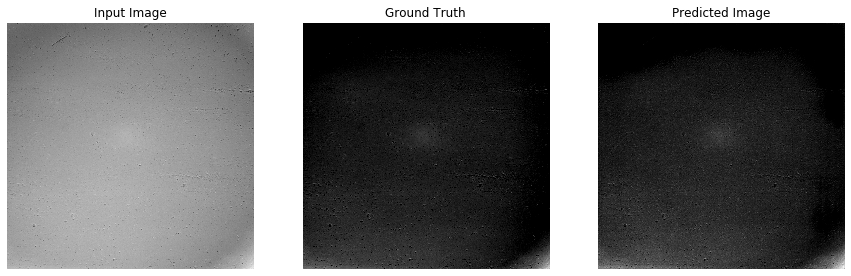

mse_ground_input       0.353932
mse_ground_predict     0.000729
mse_input_predict      0.337797
ssim_ground_input      0.191629
ssim_ground_predict    0.791392
ssim_input_predict     0.202984
dtype: float64


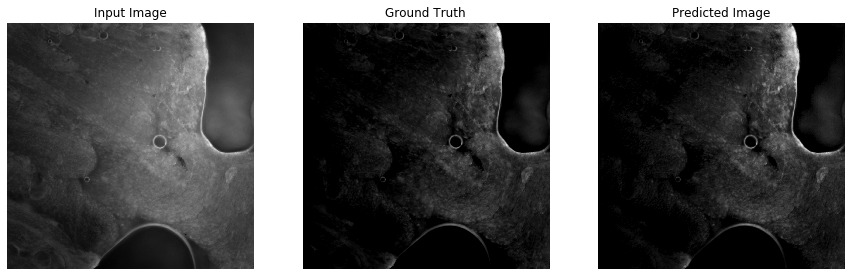

mse_ground_input       0.084116
mse_ground_predict     0.000195
mse_input_predict      0.081443
ssim_ground_input      0.291359
ssim_ground_predict    0.927966
ssim_input_predict     0.303936
dtype: float64


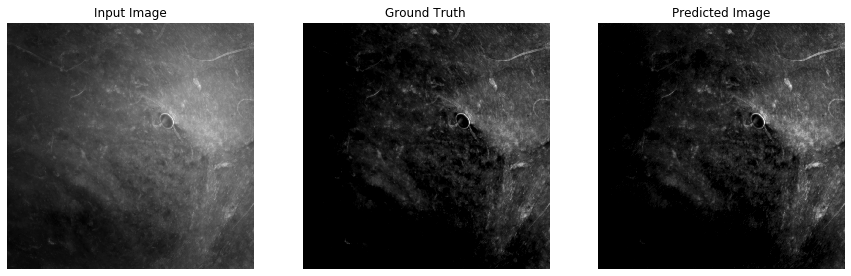

mse_ground_input       0.070360
mse_ground_predict     0.000164
mse_input_predict      0.068753
ssim_ground_input      0.338970
ssim_ground_predict    0.941745
ssim_input_predict     0.350493
dtype: float64


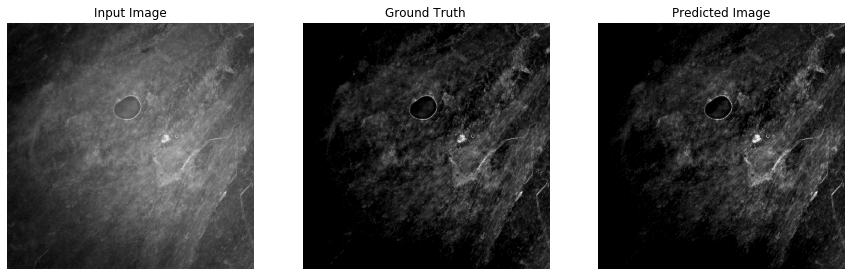

mse_ground_input       0.087273
mse_ground_predict     0.000229
mse_input_predict      0.090018
ssim_ground_input      0.352593
ssim_ground_predict    0.942757
ssim_input_predict     0.342342
dtype: float64


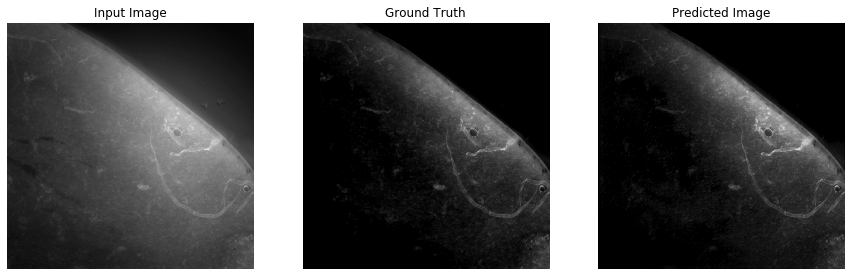

mse_ground_input       0.079875
mse_ground_predict     0.000242
mse_input_predict      0.076937
ssim_ground_input      0.261864
ssim_ground_predict    0.908496
ssim_input_predict     0.282209
dtype: float64


In [31]:
## epoch 1200
for example_input, example_target in test_dataset.take(20):
  ssim_mse(generator, example_input, example_target)

## generate test images

In [37]:
datadir_test='/home/hzhuge/Documents/prostate margin/panel2_2048'
#datadir='/home/hzhuge/Downloads/1072case/'
PATH_test=os.path.join(datadir_test)
test_dataset_name = tf.data.Dataset.list_files(PATH_test+'/*.png',shuffle=False)
test_dataset = test_dataset_name.map(load_image_test)
test_dataset = test_dataset.batch(1)
test_dataset

<DatasetV1Adapter shapes: ((None, 2048, 2048, 1), (None, 2048, 2048, 1)), types: (tf.float32, tf.float32)>

In [38]:
import re

subname=list()

for filename in test_dataset_name:
    
  fname=filename.numpy().decode('utf-8')
  res=re.split("[/.]",fname)[-2]
  subname.append(res)  

In [39]:
def generate_dataset(model, test_input, tar,index):
  # the training=True is intentional here since
  # we want the batch statistics while running the model
  # on the test dataset. If we use training=False, we will get
  # the accumulated statistics learned from the training dataset
  # (which we don't want)
  prediction = model(test_input, training=True)
  #plt.figure(figsize=(15,15))
  

#   display_list = [test_input[0], tar[0], prediction[0]]
#   title = ['InputImage', 'GroundTruth', 'PredictedImage']
  directory = r'/home/hzhuge/Documents/prostate margin/panel2_2048_result'  
 
  im=prediction[0]
  img=im[:,:,0]*0.5+0.5
  filename_total=subname[index]+'.png' 
        
  plt.imsave(os.path.join(directory,filename_total), img.numpy(),cmap='gray')

#   for i in range(3):
#         im=display_list[i]
#         img=im[:,:,0] * 0.5 + 0.5
        
       
#         filename_total=subname+'_'+title[i]+'.png' 
        
#         plt.imsave(os.path.join(directory,filename_total), img,cmap='gray')

In [40]:
i=0
for example_input, example_target in test_dataset:
     generate_dataset(generator, example_input, example_target,i)
     i=i+1   

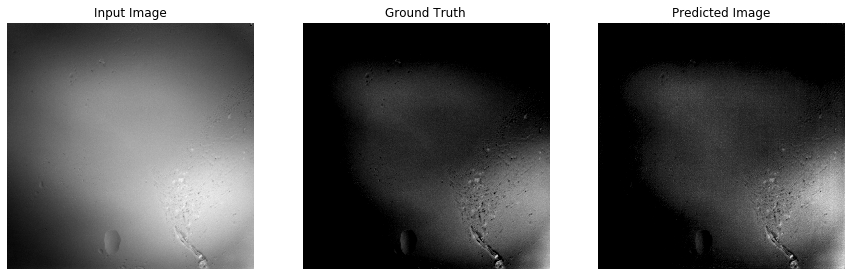

mse_ground_input       0.244136
mse_ground_predict     0.000929
mse_input_predict      0.252882
ssim_ground_input      0.250805
ssim_ground_predict    0.885464
ssim_input_predict     0.234342
dtype: float64


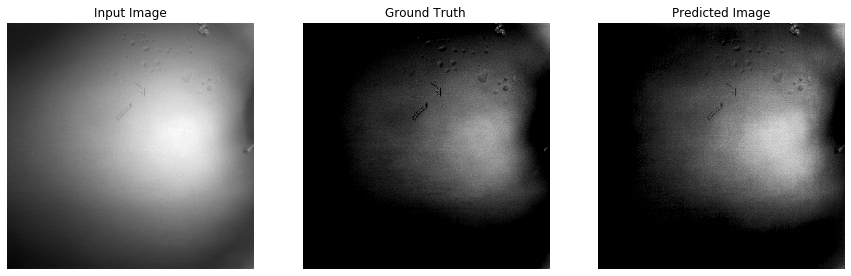

mse_ground_input       0.204707
mse_ground_predict     0.002933
mse_input_predict      0.171670
ssim_ground_input      0.251836
ssim_ground_predict    0.809801
ssim_input_predict     0.320356
dtype: float64


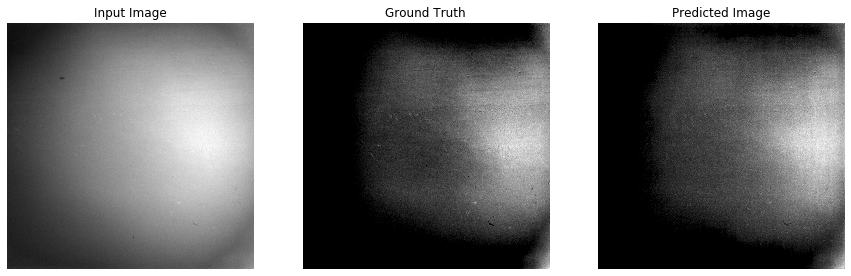

mse_ground_input       0.235610
mse_ground_predict     0.004948
mse_input_predict      0.260015
ssim_ground_input      0.267768
ssim_ground_predict    0.792990
ssim_input_predict     0.273093
dtype: float64


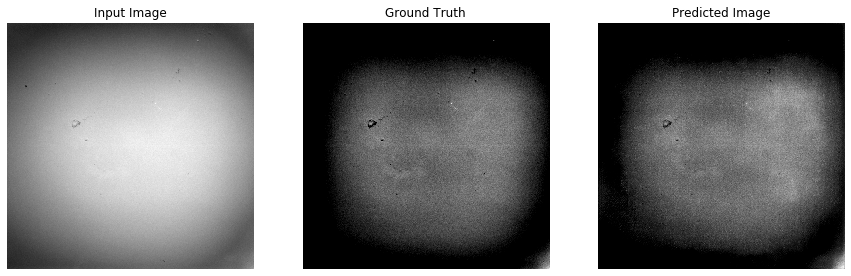

mse_ground_input       0.316492
mse_ground_predict     0.001582
mse_input_predict      0.308590
ssim_ground_input      0.244053
ssim_ground_predict    0.762240
ssim_input_predict     0.254762
dtype: float64


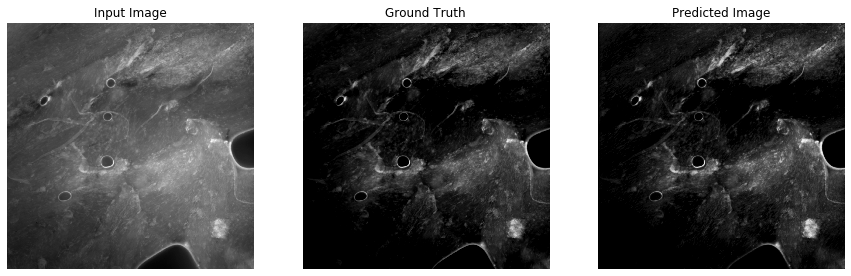

mse_ground_input       0.112653
mse_ground_predict     0.000432
mse_input_predict      0.118066
ssim_ground_input      0.312780
ssim_ground_predict    0.916724
ssim_input_predict     0.291492
dtype: float64


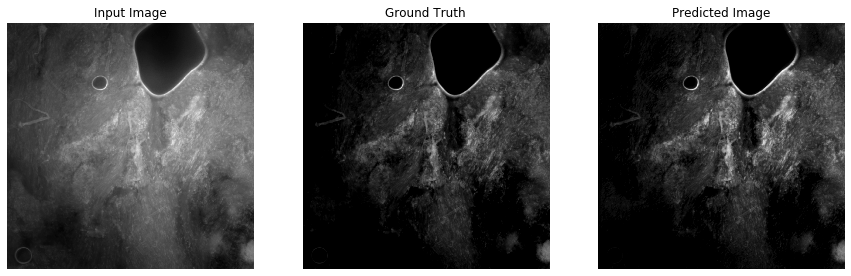

mse_ground_input       0.094916
mse_ground_predict     0.000348
mse_input_predict      0.089723
ssim_ground_input      0.306893
ssim_ground_predict    0.922441
ssim_input_predict     0.325610
dtype: float64


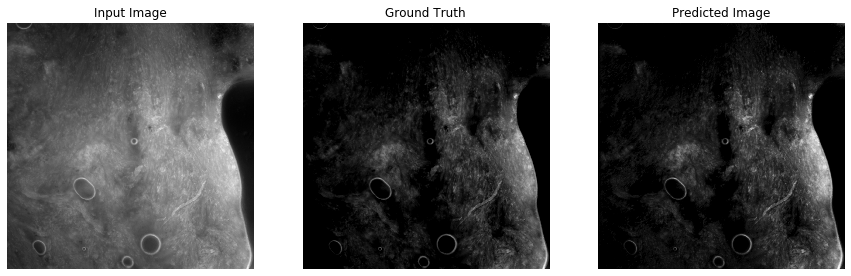

mse_ground_input       0.138228
mse_ground_predict     0.000434
mse_input_predict      0.138111
ssim_ground_input      0.264415
ssim_ground_predict    0.891671
ssim_input_predict     0.262542
dtype: float64


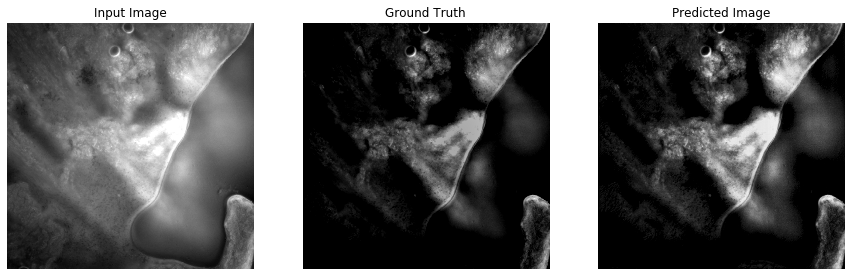

mse_ground_input       0.182901
mse_ground_predict     0.004486
mse_input_predict      0.147282
ssim_ground_input      0.225885
ssim_ground_predict    0.782920
ssim_input_predict     0.312356
dtype: float64


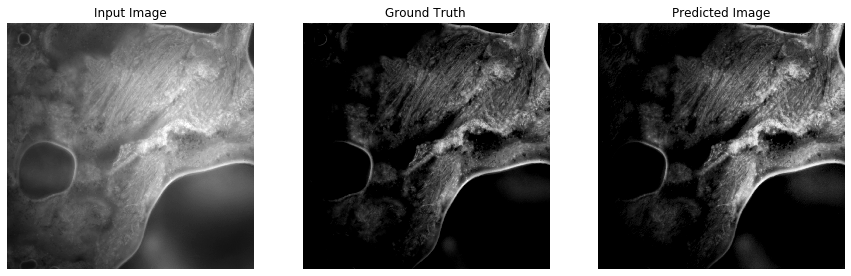

mse_ground_input       0.124793
mse_ground_predict     0.001615
mse_input_predict      0.109038
ssim_ground_input      0.287551
ssim_ground_predict    0.882957
ssim_input_predict     0.332741
dtype: float64


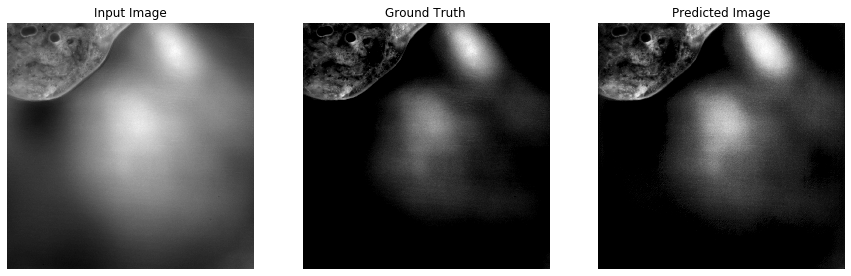

mse_ground_input       0.185357
mse_ground_predict     0.002658
mse_input_predict      0.155668
ssim_ground_input      0.238217
ssim_ground_predict    0.816606
ssim_input_predict     0.305169
dtype: float64


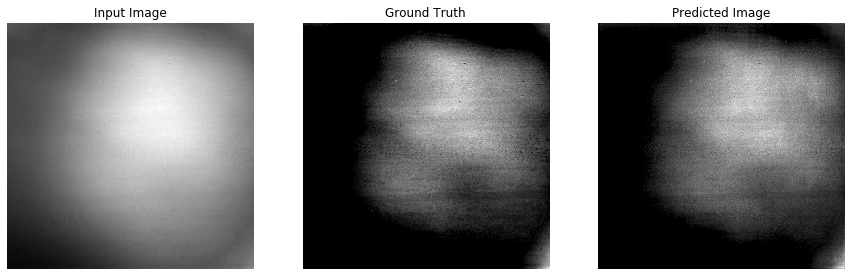

mse_ground_input       0.194462
mse_ground_predict     0.008574
mse_input_predict      0.227611
ssim_ground_input      0.275676
ssim_ground_predict    0.791604
ssim_input_predict     0.296026
dtype: float64


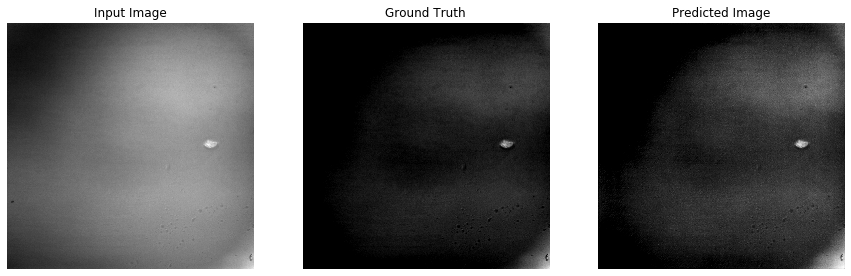

mse_ground_input       0.313782
mse_ground_predict     0.004749
mse_input_predict      0.254881
ssim_ground_input      0.201679
ssim_ground_predict    0.731243
ssim_input_predict     0.282241
dtype: float64


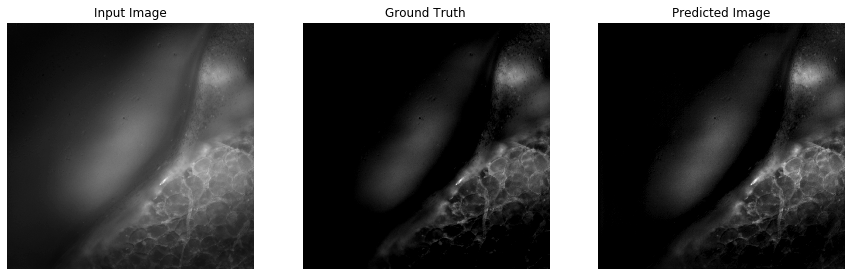

mse_ground_input       0.072181
mse_ground_predict     0.000448
mse_input_predict      0.064452
ssim_ground_input      0.236054
ssim_ground_predict    0.860711
ssim_input_predict     0.295785
dtype: float64


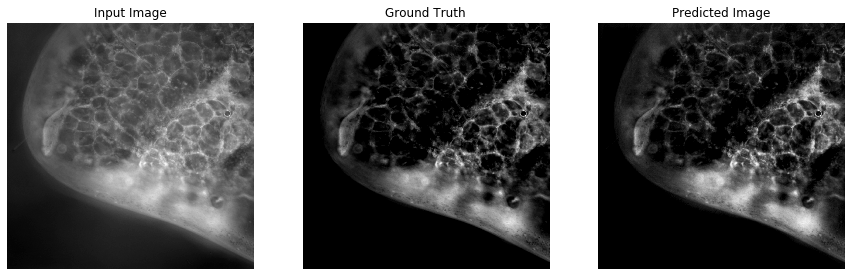

mse_ground_input       0.098570
mse_ground_predict     0.000786
mse_input_predict      0.100819
ssim_ground_input      0.312446
ssim_ground_predict    0.892012
ssim_input_predict     0.320876
dtype: float64


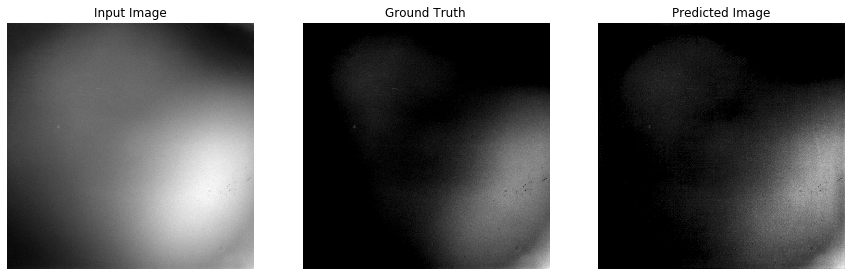

mse_ground_input       0.256430
mse_ground_predict     0.000666
mse_input_predict      0.252147
ssim_ground_input      0.231196
ssim_ground_predict    0.838357
ssim_input_predict     0.221744
dtype: float64


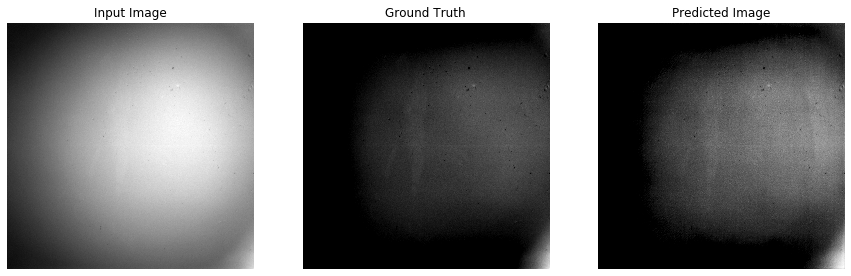

mse_ground_input       0.330086
mse_ground_predict     0.009958
mse_input_predict      0.250359
ssim_ground_input      0.234517
ssim_ground_predict    0.790353
ssim_input_predict     0.308936
dtype: float64


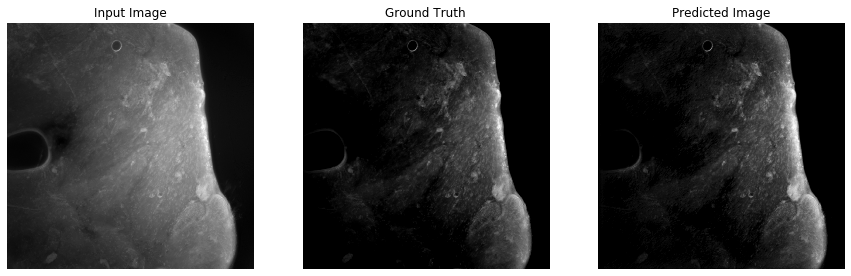

mse_ground_input       0.070195
mse_ground_predict     0.000390
mse_input_predict      0.068949
ssim_ground_input      0.277321
ssim_ground_predict    0.899689
ssim_input_predict     0.284283
dtype: float64


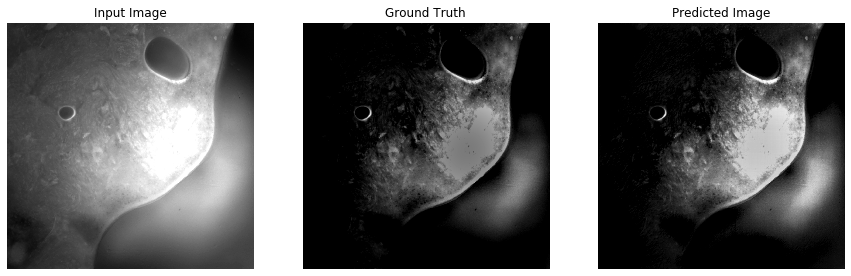

mse_ground_input       0.156776
mse_ground_predict     0.003570
mse_input_predict      0.131662
ssim_ground_input      0.251722
ssim_ground_predict    0.841800
ssim_input_predict     0.297981
dtype: float64


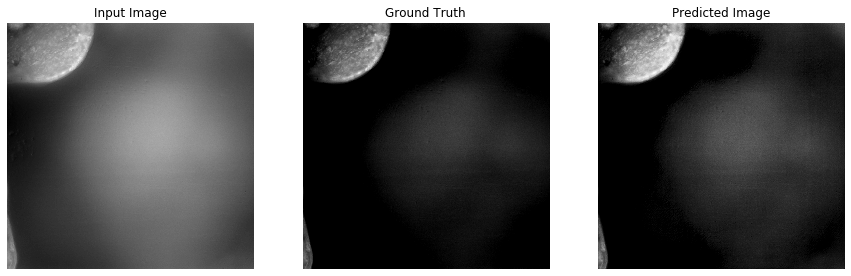

mse_ground_input       0.182914
mse_ground_predict     0.004501
mse_input_predict      0.142583
ssim_ground_input      0.201335
ssim_ground_predict    0.730626
ssim_input_predict     0.333837
dtype: float64


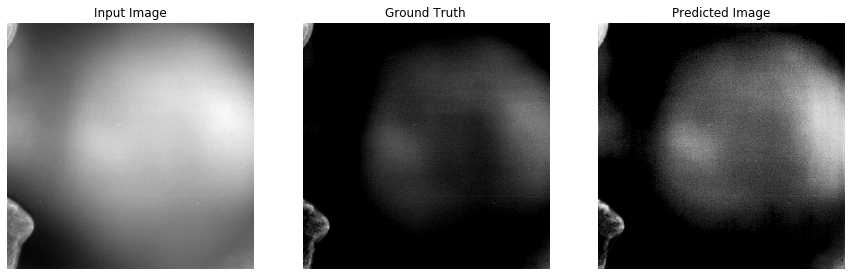

mse_ground_input       0.317067
mse_ground_predict     0.020633
mse_input_predict      0.218544
ssim_ground_input      0.206562
ssim_ground_predict    0.676355
ssim_input_predict     0.288478
dtype: float64


In [41]:
## epoch 1200
for example_input, example_target in test_dataset.take(20):
  ssim_mse(generator, example_input, example_target)